# Time-Varying Regression Coefficients via Hilbert Space Gaussian process Approximation

In this notebook we present an example of a regression model with time varying coefficients using Gaussian processes. In particular, we use a Hilbert space Gaussian process approximation in [`pymc`](https://www.pymc.io/welcome.html) to speed up the computations (see [`HSCP`](https://www.pymc.io/projects/docs/en/latest/api/gp/generated/pymc.gp.HSGP.html)). We continue using the `bikes` dataset from the previous posts ([Exploring Tools for Interpretable Machine Learning](https://juanitorduz.github.io/interpretable_ml/) and [Time-Varying Regression Coefficients via Gaussian Random Walk in PyMC](https://juanitorduz.github.io/bikes_pymc/)). Please refer to those posts for more details on the dataset, EDA and base models. In essence, we are trying to model bike count rentals as a function of meteorological variables and seasonality. We are particularly interested in the marginal effect of temperature on bike rentals, which we expect to be non-linear.

## Prepare Notebook

In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import preliz as pz
import pymc as pm
import seaborn as sns

from pymc.gp.util import plot_gp_dist
from sklearn.preprocessing import MaxAbsScaler


plt.style.use("bmh")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.facecolor"] = "white"

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

In [2]:
seed: int = sum(map(ord, "bikes"))
rng: np.random.Generator = np.random.default_rng(seed=seed)

## Read Data

We read the data and create the `date` and `eoys` variables in the previous post.

In [3]:
data_path = "https://raw.githubusercontent.com/christophM/interpretable-ml-book/master/data/bike.csv"

raw_data_df = pd.read_csv(
    data_path,
    dtype={
        "season": "category",
        "mnth": "category",
        "holiday": "category",
        "weekday": "category",
        "workingday": "category",
        "weathersit": "category",
        "cnt": "int",
    },
)

data_df = raw_data_df.copy()

data_df["date"] = pd.to_datetime("2011-01-01") + data_df["days_since_2011"].apply(
    lambda z: pd.Timedelta(z, unit="D")
)

# end-of-year Gaussian bump
is_december = data_df["date"].dt.month == 12
eoy_mu = 25
eoy_sigma = 7
eoy_arg = (data_df["date"].dt.day - eoy_mu) / eoy_sigma
data_df["eoy"] = is_december * np.exp(-(eoy_arg**2))

data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   season           731 non-null    category      
 1   yr               731 non-null    int64         
 2   mnth             731 non-null    category      
 3   holiday          731 non-null    category      
 4   weekday          731 non-null    category      
 5   workingday       731 non-null    category      
 6   weathersit       731 non-null    category      
 7   temp             731 non-null    float64       
 8   hum              731 non-null    float64       
 9   windspeed        731 non-null    float64       
 10  cnt              731 non-null    int64         
 11  days_since_2011  731 non-null    int64         
 12  date             731 non-null    datetime64[ns]
 13  eoy              731 non-null    float64       
dtypes: category(6), datetime64[ns](1), float64

## Prepare Data

We scale and one-hot encode the continuous and categorical variables, respectively.

In [4]:
target = "cnt"
target_scaled = f"{target}_scaled"

endog_scaler = MaxAbsScaler()
exog_scaler = MaxAbsScaler()


data_df[target_scaled] = endog_scaler.fit_transform(X=data_df[[target]])
data_df[["temp_scaled", "hum_scaled", "windspeed_scaled"]] = exog_scaler.fit_transform(
    X=data_df[["temp", "hum", "windspeed"]]
)

In [5]:
n = data_df.shape[0]
# target
cnt = data_df[target].to_numpy()
cnt_scaled = data_df[target_scaled].to_numpy()
# date feature
date = data_df["date"].to_numpy()
# model regressors
temp_scaled = data_df["temp_scaled"].to_numpy()
hum_scaled = data_df["hum_scaled"].to_numpy()
windspeed_scaled = data_df["windspeed_scaled"].to_numpy()
holiday_idx, holiday = data_df["holiday"].factorize(sort=True)
workingday_idx, workingday = data_df["workingday"].factorize(sort=True)
weathersit_idx, weathersit = data_df["weathersit"].factorize(sort=True)
t = data_df["days_since_2011"].to_numpy() / data_df["days_since_2011"].max()
eoy = data_df["eoy"].to_numpy()

## Model Structure

We model the bikes count through a [`StudentT`](https://www.pymc.io/projects/docs/en/stable/api/distributions/generated/pymc.StudentT.html) likelihood (as an approximation as the bike counts are large integers). Now we describe the components of the model.

- For the categorical variables we use a [`ZeroSumNormal`](https://www.pymc.io/projects/docs/en/latest/api/distributions/generated/pymc.ZeroSumNormal.html#pymc.ZeroSumNormal) distribution as we have an intercept term and we are interested about the relative deviations.
- For the continuous variables `temp`, `hum` and `windspeed` we use [`Gaussian processes`](https://en.wikipedia.org/wiki/Gaussian_process) to model the time-variant coefficients. For a introduction to Gaussian processes you can see previous blog posts: [Bayesian Regression as a Gaussian Process](https://juanitorduz.github.io/reg_bayesian_regression/) and [An Introduction to Gaussian Process Regression](https://juanitorduz.github.io/gaussian_process_reg/).
  - We use [`ExpQuad`](https://www.pymc.io/projects/docs/en/stable/api/gp/generated/pymc.gp.cov.ExpQuad.html) kernels.
  - As the data is scaled we use a single length-scale and amplitudes for all the variables (I tried a hierarchical model but it did not make much difference).
  - Instead of adding manually a linear trend, we use another Gaussian process to model a latent background trend.
  - We use a [`HSGP`](https://www.pymc.io/projects/docs/en/latest/api/gp/generated/pymc.gp.HSGP.html) approximation to speed up the computations. Please check the video [PyMCon Web Series - Introduction to Hilbert Space GPs in PyMC](https://www.youtube.com/watch?v=ri5sJAdcYHk) by Bill Engels for a great introduction to the topic. The original paper [Hilbert space methods for reduced-rank Gaussian process regression](https://link.springer.com/article/10.1007/s11222-019-09886-w) is also a great resource.

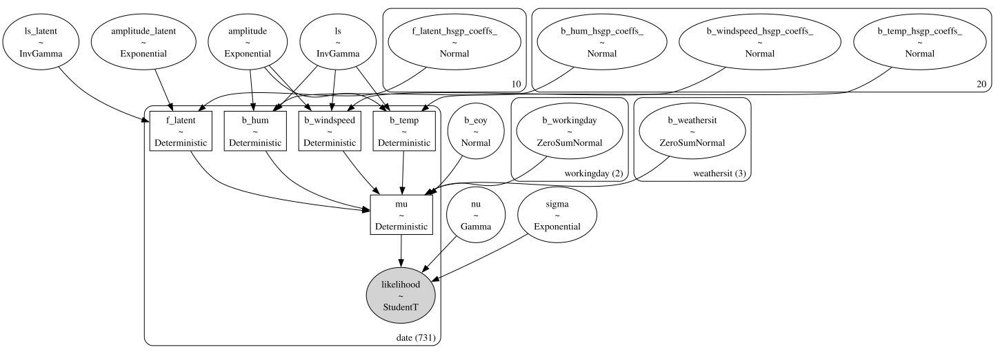

In [15]:
coords = {
    "date": date,
    "workingday": workingday,
    "weathersit": weathersit,
}


with pm.Model(coords=coords) as model:
    # --- priors ---
    ls_latent_params = pm.find_constrained_prior(
        distribution=pm.InverseGamma,
        lower=0.05,
        upper=0.5,
        init_guess={"alpha": 2, "beta": 0.2},
        mass=0.95,
    )
    ls_latent = pm.InverseGamma(name="ls_latent", **ls_latent_params)
    amplitude_latent = pm.Exponential(name="amplitude_latent", lam=1 / 0.5)
    cov_latent = amplitude_latent**2 * pm.gp.cov.ExpQuad(input_dim=1, ls=ls_latent)
    gp_latent = pm.gp.HSGP(m=[10], c=1.3, cov_func=cov_latent)
    f_latent = gp_latent.prior(name="f_latent", X=t[:, None], dims="date")

    ls_params = pm.find_constrained_prior(
        distribution=pm.InverseGamma,
        lower=0.1,
        upper=0.7,
        init_guess={"alpha": 2, "beta": 0.5},
        mass=0.95,
    )
    ls = pm.InverseGamma(name="ls", **ls_params)

    amplitude = pm.Exponential(name="amplitude", lam=1 / 0.5)

    cov_temp = amplitude**2 * pm.gp.cov.ExpQuad(input_dim=1, ls=ls)
    gp_temp = pm.gp.HSGP(m=[20], c=1.3, cov_func=cov_temp)
    b_temp = gp_temp.prior(name="b_temp", X=temp_scaled[:, None], dims="date")

    cov_hum = amplitude**2 * pm.gp.cov.ExpQuad(input_dim=1, ls=ls)
    gp_hum = pm.gp.HSGP(m=[20], c=1.3, cov_func=cov_hum)
    b_hum = gp_hum.prior(name="b_hum", X=hum_scaled[:, None], dims="date")

    cov_windspeed = amplitude**2 * pm.gp.cov.ExpQuad(input_dim=1, ls=ls)
    gp_windspeed = pm.gp.HSGP(m=[20], c=1.3, cov_func=cov_windspeed)
    b_windspeed = gp_hum.prior(
        name="b_windspeed", X=windspeed_scaled[:, None], dims="date"
    )

    b_workingday = pm.ZeroSumNormal(name="b_workingday", sigma=1, dims="workingday")
    b_weathersit = pm.ZeroSumNormal(name="b_weathersit", sigma=1, dims="weathersit")
    b_eoy = pm.Normal(name="b_eoy", mu=0, sigma=1)
    nu = pm.Gamma(name="nu", alpha=4, beta=1)
    sigma = pm.Exponential(name="sigma", lam=1 / 0.2)

    # --- model parametrization ---
    mu = pm.Deterministic(
        name="mu",
        var=(
            f_latent
            + b_temp * temp_scaled
            + b_hum * hum_scaled
            + b_windspeed * windspeed_scaled
            + b_workingday[workingday_idx]
            + b_weathersit[weathersit_idx]
            + b_eoy * eoy
        ),
        dims="date",
    )

    # --- likelihood ---
    likelihood = pm.StudentT(
        name="likelihood", mu=mu, nu=nu, sigma=sigma, dims="date", observed=cnt_scaled
    )


pm.model_to_graphviz(model=model)

### Prior Predictive Checks

Before sampling from the prior distribution, we can visualize the prior for the `ls` parameter:

/var/folders/xv/983bz0q51wbb27tjz2c4r40w0000gn/T/ipykernel_66243/2978534819.py:20: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout(h_pad=4)


[Text(0.5, 1.0, '$ls$ Prior'),
 (0.0, 1.0),
 Text(0.5, 30.58333333333332, 'ls'),
 Text(67.58333333333333, 0.5, 'pdf')]

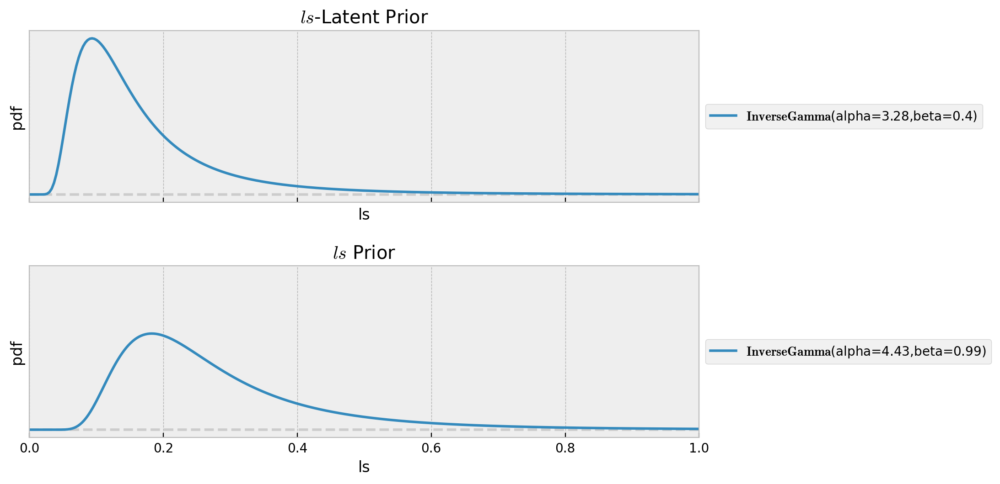

In [16]:
ls_latent_params = pm.find_constrained_prior(
    distribution=pm.InverseGamma,
    lower=0.05,
    upper=0.5,
    init_guess={"alpha": 2, "beta": 0.2},
    mass=0.95,
)

ls_params = pm.find_constrained_prior(
    distribution=pm.InverseGamma,
    lower=0.1,
    upper=0.7,
    init_guess={"alpha": 2, "beta": 0.5},
    mass=0.95,
)

fig, ax = plt.subplots(
    nrows=2, ncols=1, figsize=(8, 5), sharex=True, sharey=True, layout="constrained"
)
fig.tight_layout(h_pad=4)
pz.InverseGamma(**ls_latent_params).plot_pdf(ax=ax[0])
ax[0].set(title=r"$ls$-Latent Prior", xlim=(0, 1), xlabel="ls", ylabel="pdf")
pz.InverseGamma(**ls_params).plot_pdf(ax=ax[1])
ax[1].set(title=r"$ls$ Prior", xlim=(0, 1), xlabel="ls", ylabel="pdf")

In [17]:
with model:
    prior_predictive = pm.sample_prior_predictive(samples=500, random_seed=rng)


Sampling: [amplitude, amplitude_latent, b_eoy, b_hum_hsgp_coeffs_, b_temp_hsgp_coeffs_, b_weathersit, b_windspeed_hsgp_coeffs_, b_workingday, f_latent_hsgp_coeffs_, likelihood, ls, ls_latent, nu, sigma]


[Text(0.5, 1.0, 'Prior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, 'cnt_scaled')]

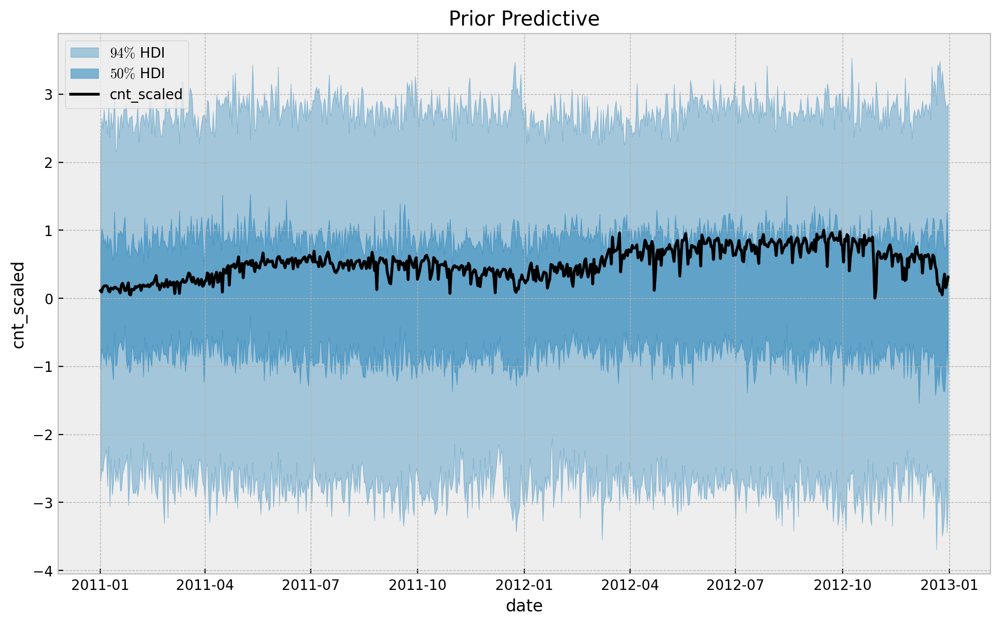

In [18]:
fig, ax = plt.subplots()
az.plot_hdi(
    x=date,
    y=prior_predictive["prior_predictive"]["likelihood"],
    color="C0",
    smooth=False,
    hdi_prob=0.94,
    fill_kwargs={"alpha": 0.4, "label": "$94\%$ HDI"},
    ax=ax,
)
az.plot_hdi(
    x=date,
    y=prior_predictive["prior_predictive"]["likelihood"],
    color="C0",
    smooth=False,
    hdi_prob=0.5,
    fill_kwargs={"alpha": 0.6, "label": "$50\%$ HDI"},
    ax=ax,
)
ax.plot(date, cnt_scaled, color="black", label=target_scaled)
ax.legend(loc="upper left")
ax.set(
    title="Prior Predictive",
    xlabel="date",
    ylabel=target_scaled,
)


The model specification looks reasonable.

## Model Fit

Now we fit the model:

In [19]:
with model:
    idata = pm.sample(
        target_accept=0.9,
        draws=4_000,
        chains=5,
        nuts_sampler="numpyro",
        random_seed=rng,
    )
    posterior_predictive = pm.sample_posterior_predictive(trace=idata, random_seed=rng)


/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/pymc/sampling/mcmc.py:273: UserWarning: Use of external NUTS sampler is still experimental
  warnings.warn("Use of external NUTS sampler is still experimental", UserWarning)


Compiling...
Compilation time =  0:00:16.838012
Sampling...


  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

Sampling time =  0:02:21.203630
Transforming variables...
Transformation time =  0:00:02.779536


Sampling: [likelihood]


In [20]:
idata["sample_stats"]["diverging"].sum().item()

0

Observe that the model samples quite fast given the fact it has $4$ Gaussian processes and more than $7000$ observations. We can now look into the posterior distributions of the coefficients and diagnostics.

In [21]:
var_names = [
    "ls_latent",
    "ls",
    "amplitude_latent",
    "amplitude",
    "b_workingday",
    "b_weathersit",
    "b_eoy",
    "sigma",
    "nu",
]

az.summary(data=idata, var_names=var_names)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ls_latent,0.146,0.027,0.092,0.194,0.001,0.001,2871.0,950.0,1.0
ls,0.402,0.053,0.301,0.504,0.001,0.000,10008.0,12251.0,1.0
amplitude_latent,0.291,0.099,0.141,0.475,0.001,0.001,7212.0,10755.0,1.0
amplitude,0.279,0.095,0.139,0.452,0.001,0.001,9813.0,11962.0,1.0
b_workingday[NO WORKING DAY],-0.009,0.003,-0.014,-0.004,0.000,0.000,39199.0,13778.0,1.0
b_workingday[WORKING DAY],0.009,0.003,0.004,0.014,0.000,0.000,39199.0,13778.0,1.0
b_weathersit[GOOD],0.074,0.008,0.058,0.090,0.000,0.000,23841.0,16360.0,1.0
b_weathersit[MISTY],0.040,0.008,0.025,0.054,0.000,0.000,23191.0,16198.0,1.0
b_weathersit[RAIN/SNOW/STORM],-0.114,0.015,-0.142,-0.086,0.000,0.000,24224.0,14990.0,1.0
b_eoy,-0.197,0.022,-0.239,-0.156,0.000,0.000,37325.0,15861.0,1.0


/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


Text(0.5, 0.98, 'Time-Varying Coefficient Model - Trace')

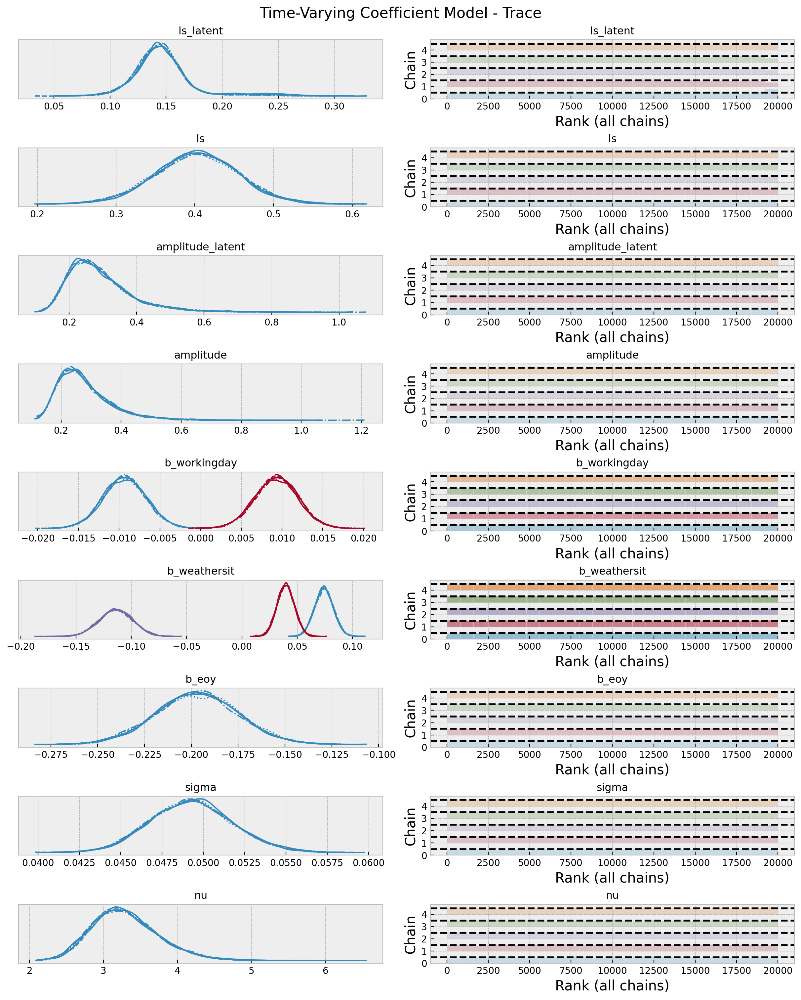

In [22]:
axes = az.plot_trace(
    data=idata,
    var_names=var_names,
    compact=True,
    kind="rank_bars",
    backend_kwargs={"figsize": (12, 15), "layout": "constrained"},
)
plt.gcf().suptitle("Time-Varying Coefficient Model - Trace", fontsize=16)


array([<AxesSubplot:title={'center':'94.0% HDI'}>,
       <AxesSubplot:title={'center':'ess'}>,
       <AxesSubplot:title={'center':'r_hat'}>], dtype=object)

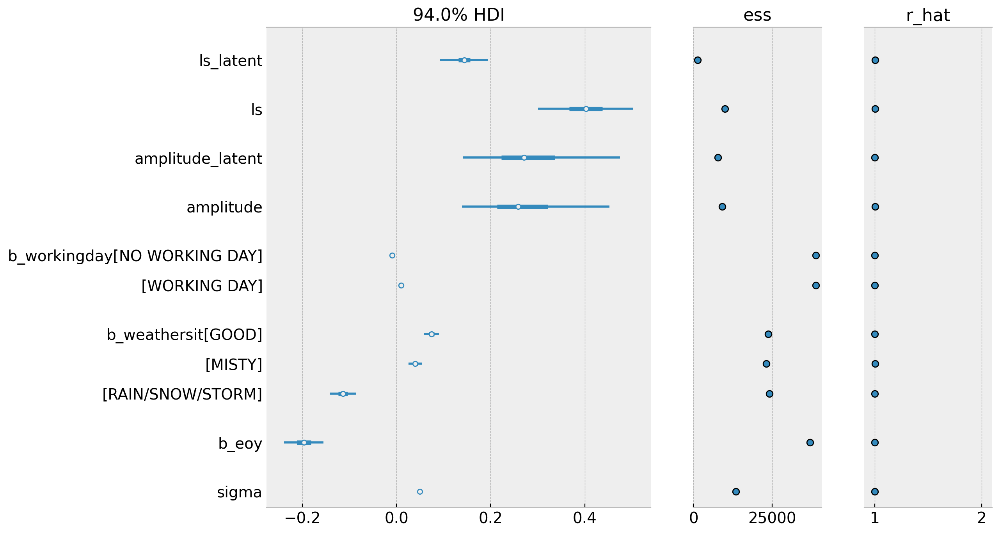

In [23]:
az.plot_forest(
    data=idata,
    var_names=[v for v in var_names if v != "nu"],
    combined=True,
    figsize=(12, 8),
    ess=True,
    r_hat=True,
)


/var/folders/xv/983bz0q51wbb27tjz2c4r40w0000gn/T/ipykernel_66243/2155635761.py:4: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout(h_pad=5)


[Text(0.5, 1.0, '$ls$ Prior vs Posterior'),
 (0.0, 1.0),
 Text(0.5, 41.583333333333314, 'ls'),
 Text(92.58333333333333, 0.5, 'pdf')]

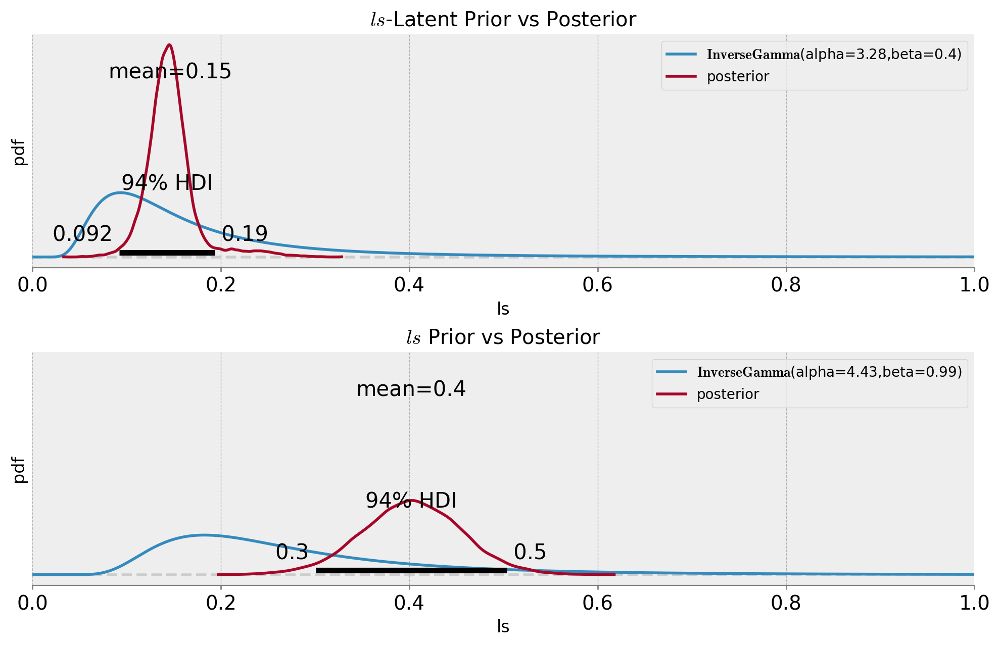

In [39]:
fig, ax = plt.subplots(
    nrows=2, ncols=1, figsize=(10, 6), sharex=True, sharey=True, layout="constrained"
)
fig.tight_layout(h_pad=5)
pz.InverseGamma(**ls_latent_params).plot_pdf(ax=ax[0])
az.plot_posterior(
    data=idata, var_names=["ls_latent"], color="C1", label="posterior", ax=ax[0]
)
ax[0].set(
    title=r"$ls$-Latent Prior vs Posterior", xlim=(0, 1), xlabel="ls", ylabel="pdf"
)
pz.InverseGamma(**ls_params).plot_pdf(ax=ax[1])
az.plot_posterior(data=idata, var_names=["ls"], color="C1", label="posterior", ax=ax[1])
ax[1].set(title=r"$ls$ Prior vs Posterior", xlim=(0, 1), xlabel="ls", ylabel="pdf")

The results look good and the coefficients for the categorical variables make a lot of sense!

## Posterior Predictive Checks

[Text(0.5, 1.0, 'Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, 'cnt_scaled')]

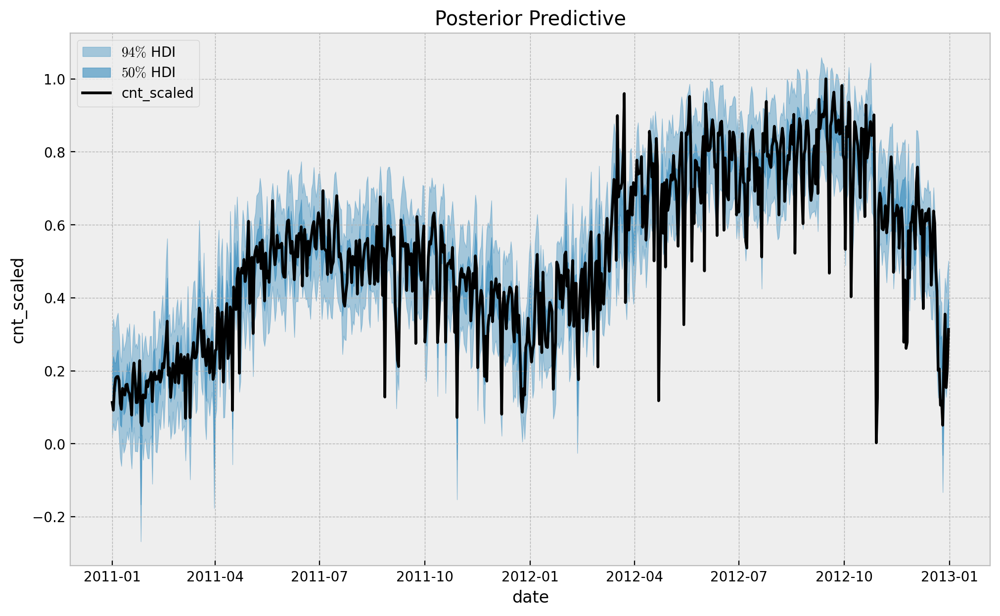

In [25]:
fig, ax = plt.subplots()
az.plot_hdi(
    x=date,
    y=posterior_predictive["posterior_predictive"]["likelihood"],
    color="C0",
    smooth=False,
    hdi_prob=0.94,
    fill_kwargs={"alpha": 0.4, "label": "$94\%$ HDI"},
    ax=ax,
)
az.plot_hdi(
    x=date,
    y=posterior_predictive["posterior_predictive"]["likelihood"],
    color="C0",
    smooth=False,
    hdi_prob=0.5,
    fill_kwargs={"alpha": 0.6, "label": "$50\%$ HDI"},
    ax=ax,
)
ax.plot(date, cnt_scaled, color="black", label=target_scaled)
ax.legend(loc="upper left")
ax.set(
    title="Posterior Predictive",
    xlabel="date",
    ylabel=target_scaled,
)

[Text(0.5, 1.0, 'Posterior Predictive Check'),
 Text(0.5, 0, 'likelihood (bike counts scaled)'),
 (-0.5, 1.5)]

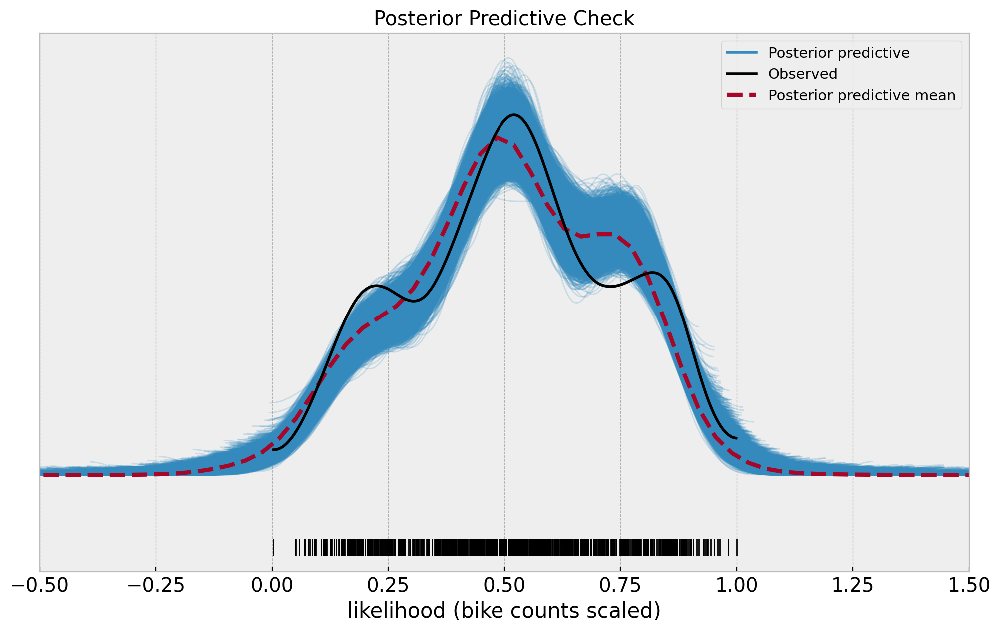

In [26]:
ax = az.plot_ppc(
    data=posterior_predictive,
    observed_rug=True,
    random_seed=seed,
)
ax.set(
    title="Posterior Predictive Check",
    xlabel="likelihood (bike counts scaled)",
    xlim=(-0.5, 1.5),
)

## Model Components Deep Dive

Now we examine the gaussian processes components of the model in more detail.

### Latent Trend

We start by looking into the latent trend components:

[Text(0.5, 1.0, 'Latent Process - Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '')]

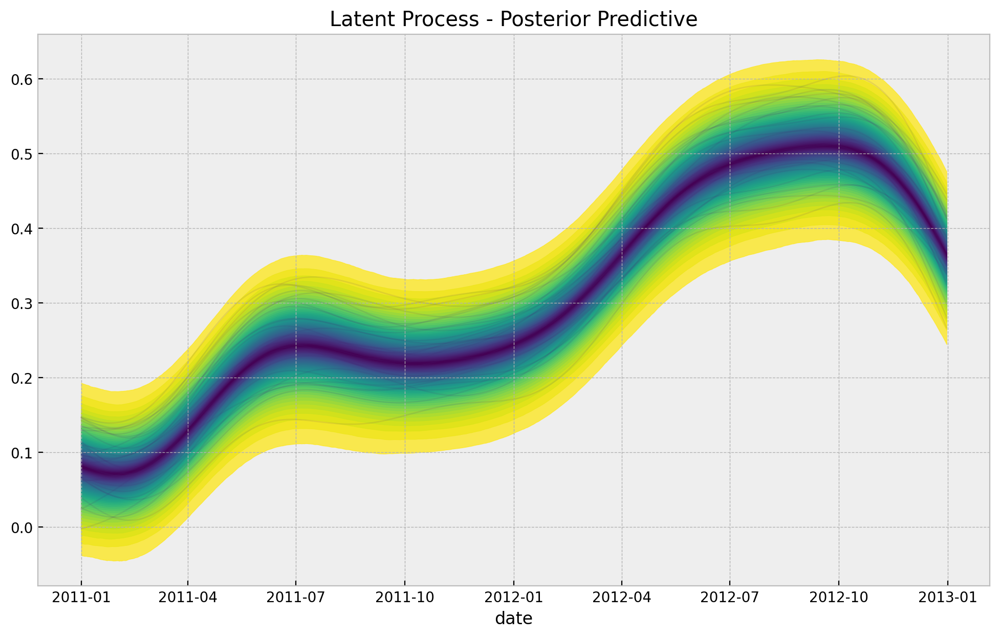

In [27]:
f_latent_samples = az.extract(data=idata, var_names=["f_latent"]).transpose(
    "sample", ...
)

fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=f_latent_samples,
    x=date,
    palette="viridis_r",
)
ax.set(title="Latent Process - Posterior Predictive", xlabel="date", ylabel=None)

We see that this latent process is very smooth and seems to be capturing the global tred of the bike rentals.

### Temperature

We now focus on the variable `temp`, which is the one we are most interested in.

[Text(0.5, 1.0, 'Temperature Coefficient - Posterior Predictive'),
 Text(0.5, 0, 'temp'),
 Text(0, 0.5, '')]

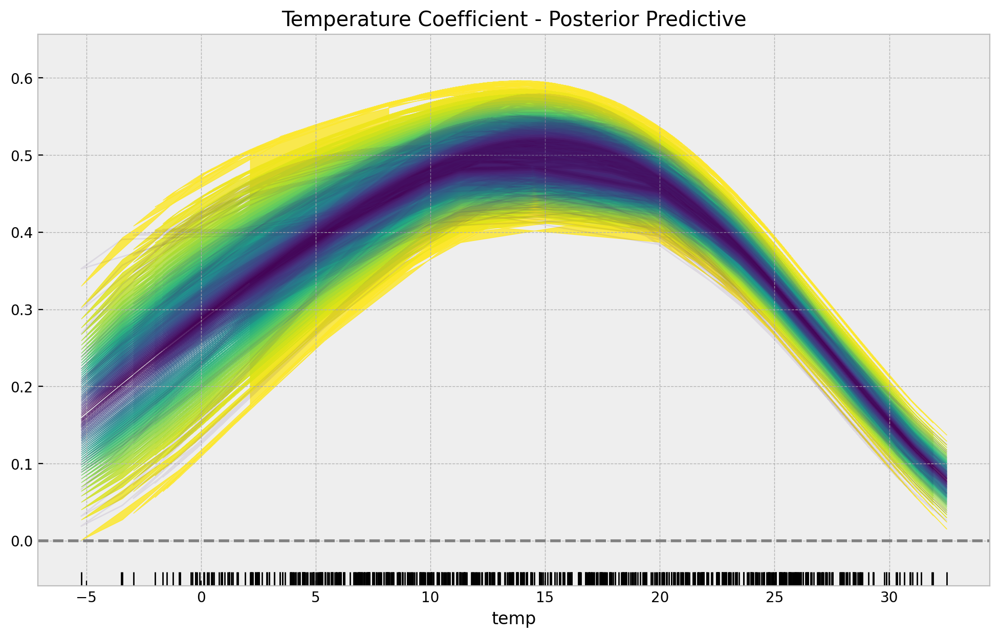

In [28]:
b_temp_samples = az.extract(data=idata, var_names=["b_temp"]).transpose("sample", ...)

fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=b_temp_samples,
    x=data_df["temp"].to_numpy(),
    palette="viridis_r",
)
sns.rugplot(x=data_df["temp"], color="black", ax=ax)
ax.axhline(y=0.0, color="gray", linestyle="--")
ax.set(
    title="Temperature Coefficient - Posterior Predictive", xlabel="temp", ylabel=None
)

The time-varying effect is similar to the one obtained in the previous post [Time-Varying Regression Coefficients via Gaussian Random Walk in PyMC](https://juanitorduz.github.io/bikes_pymc/). In this case the estimation is less noisy, in particular for lower temperatures. This might be due to the fact that we are using a more flexible trend component. Let's look now into the development over time:

[Text(0.5, 1.0, 'Temperature Coefficient over Time - Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '')]

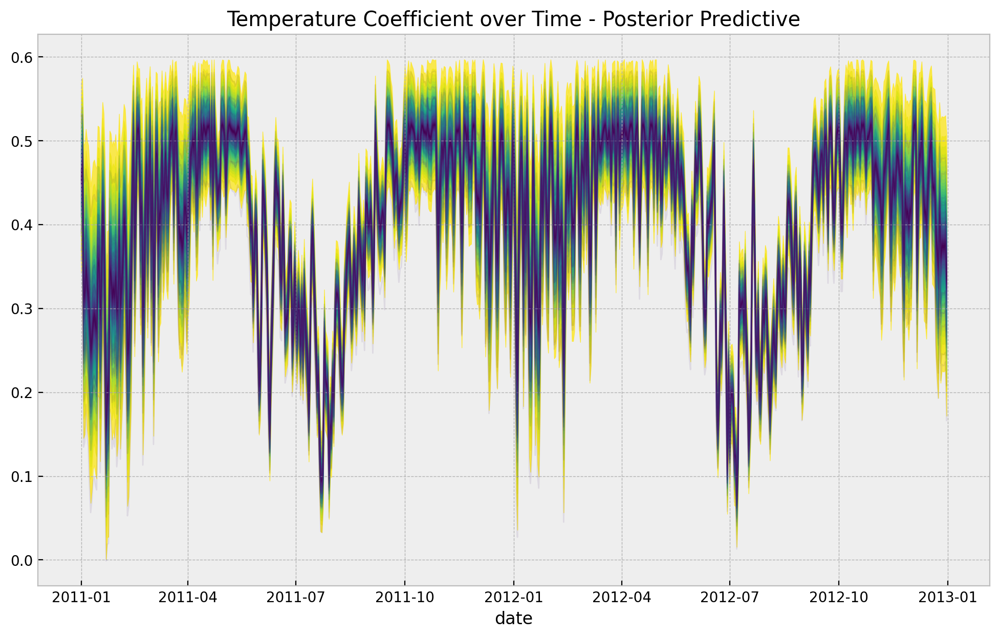

In [29]:
fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=b_temp_samples,
    x=date,
    palette="viridis_r",
)
ax.set(
    title="Temperature Coefficient over Time - Posterior Predictive",
    xlabel="date",
    ylabel=None,
)


We see how the temperature effect drops significantly during the summer months, while relatively stable during the rest of the year.

Let's compare the latent trend and the temperature effects:

[Text(0.5, 1.0, 'Latent Process - Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '')]

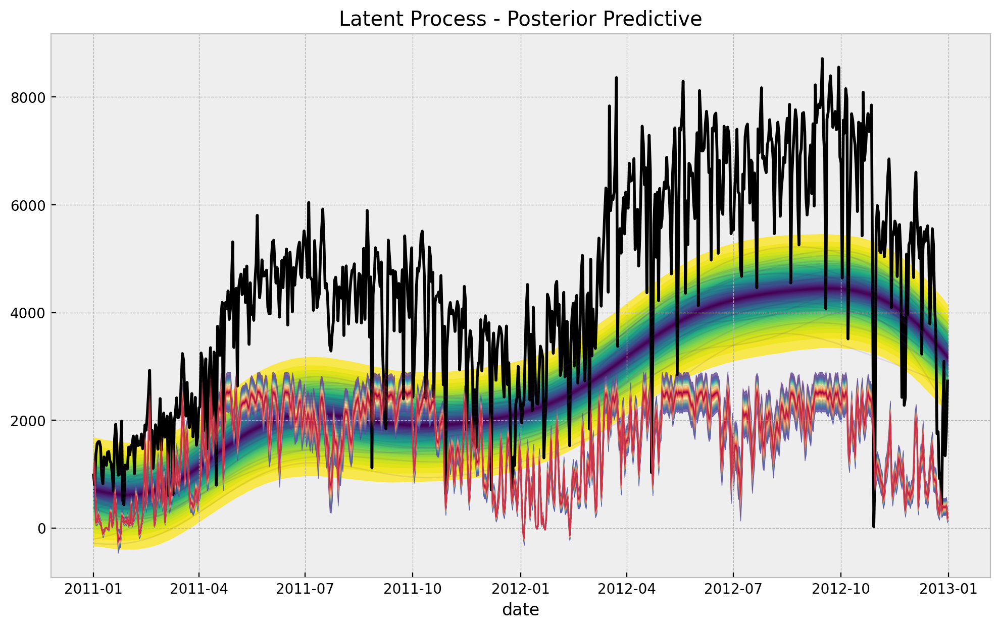

In [30]:
fig, ax = plt.subplots(figsize=(12, 7))
sns.lineplot(x=date, y=cnt, color="black", ax=ax)
plot_gp_dist(
    ax=ax,
    samples=endog_scaler.inverse_transform(X=f_latent_samples),
    x=date,
    palette="viridis_r",
)
plot_gp_dist(
    ax=ax,
    samples=endog_scaler.inverse_transform(X=b_temp_samples * temp_scaled[None, ...]),
    x=date,
    palette="Spectral_r",
)
ax.set(title="Latent Process - Posterior Predictive", xlabel="date", ylabel=None)


### Humidity

[Text(0.5, 1.0, 'Humidity Coefficient - Posterior Predictive'),
 Text(0.5, 0, 'hum'),
 Text(0, 0.5, '')]

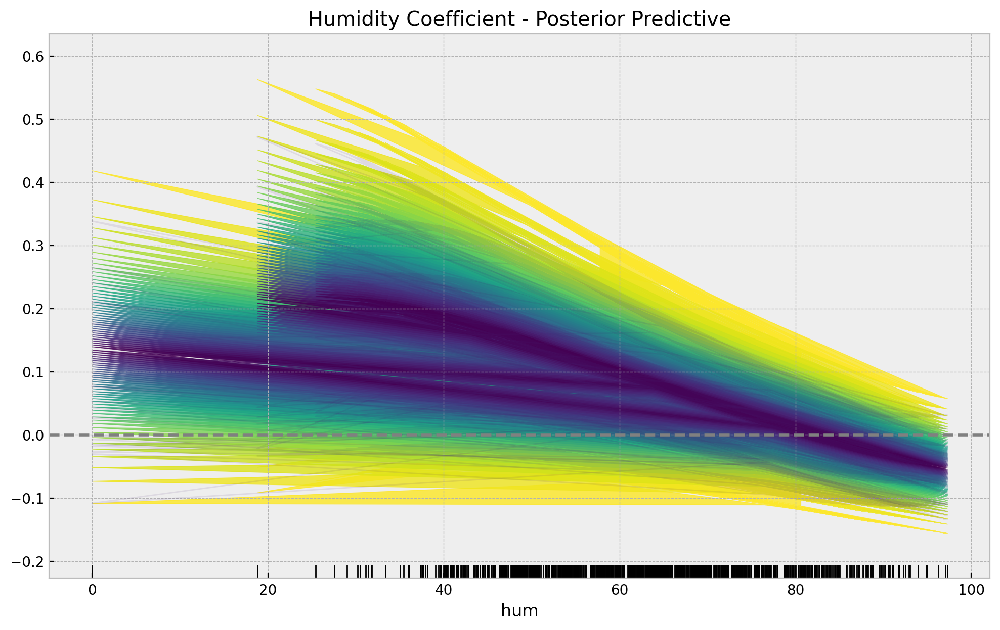

In [31]:
b_hum_samples = az.extract(data=idata, var_names=["b_hum"]).transpose("sample", ...)

fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=b_hum_samples,
    x=data_df["hum"].to_numpy(),
    palette="viridis_r",
)
sns.rugplot(x=data_df["hum"], color="black", ax=ax)
ax.axhline(y=0.0, color="gray", linestyle="--")
ax.set(title="Humidity Coefficient - Posterior Predictive", xlabel="hum", ylabel=None)

This variable seems to have a decreasing effect on the bike rentals. It even changes sign for humidity values higher than $0.8$.

[Text(0.5, 1.0, 'Humidity Coefficient over Time - Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '')]

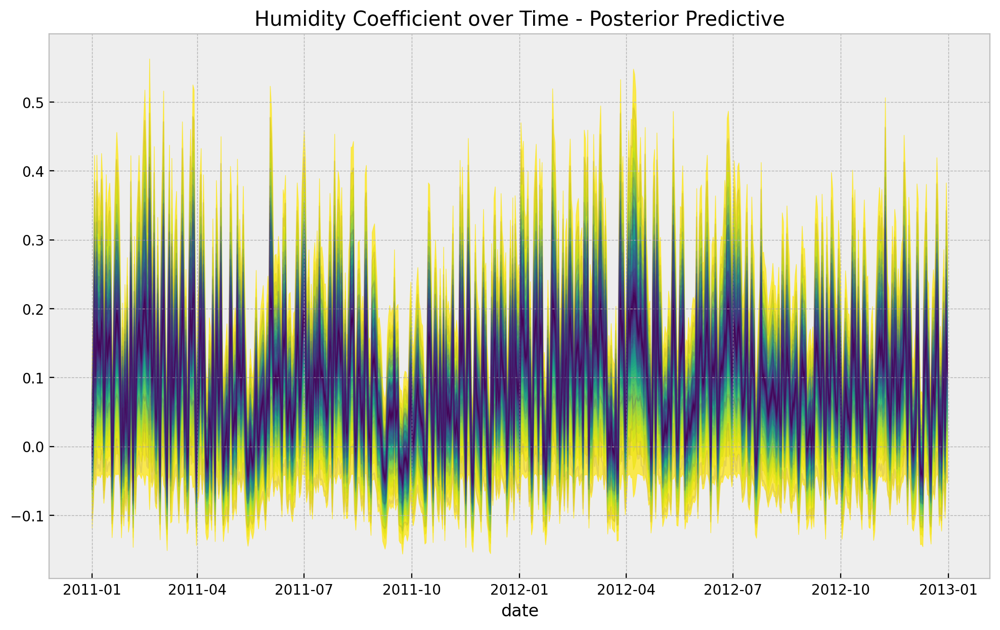

In [32]:
fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=b_hum_samples,
    x=date,
    palette="viridis_r",
)
ax.set(
    title="Humidity Coefficient over Time - Posterior Predictive",
    xlabel="date",
    ylabel=None,
)


### Wind Speed

[Text(0.5, 1.0, 'Wind Speed Coefficient - Posterior Predictive'),
 Text(0.5, 0, 'windspeed'),
 Text(0, 0.5, '')]

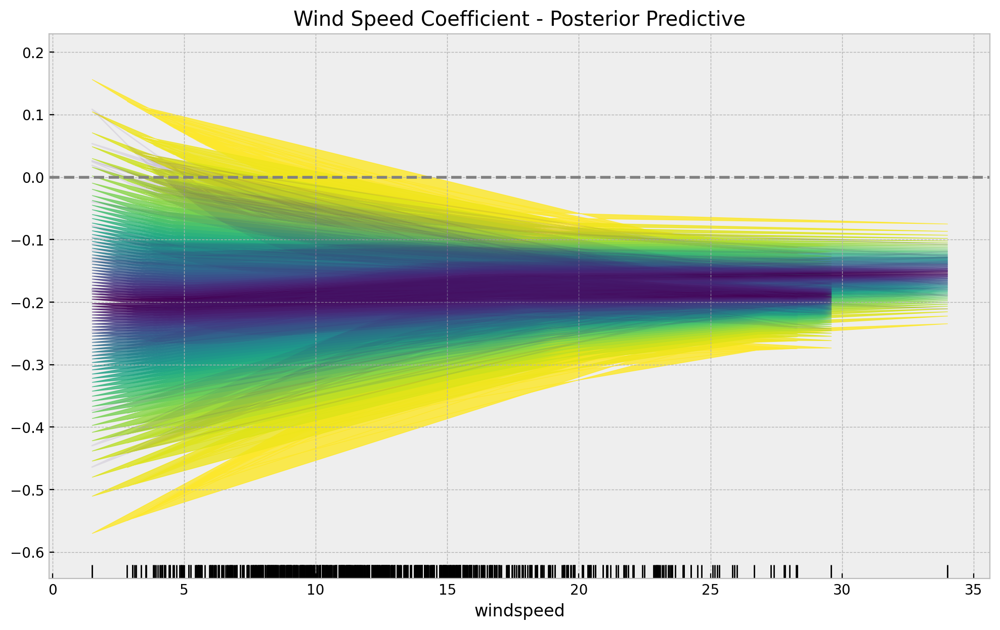

In [33]:
b_windspeed_samples = az.extract(data=idata, var_names=["b_windspeed"]).transpose(
    "sample", ...
)

fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=b_windspeed_samples,
    x=data_df["windspeed"].to_numpy(),
    palette="viridis_r",
)
sns.rugplot(x=data_df["windspeed"], color="black", ax=ax)
ax.axhline(y=0.0, color="gray", linestyle="--")
ax.set(
    title="Wind Speed Coefficient - Posterior Predictive",
    xlabel="windspeed",
    ylabel=None,
)

The winds speed coefficient looks flat and negative.

[Text(0.5, 1.0, 'Wind Speed Coefficient over Time - Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '')]

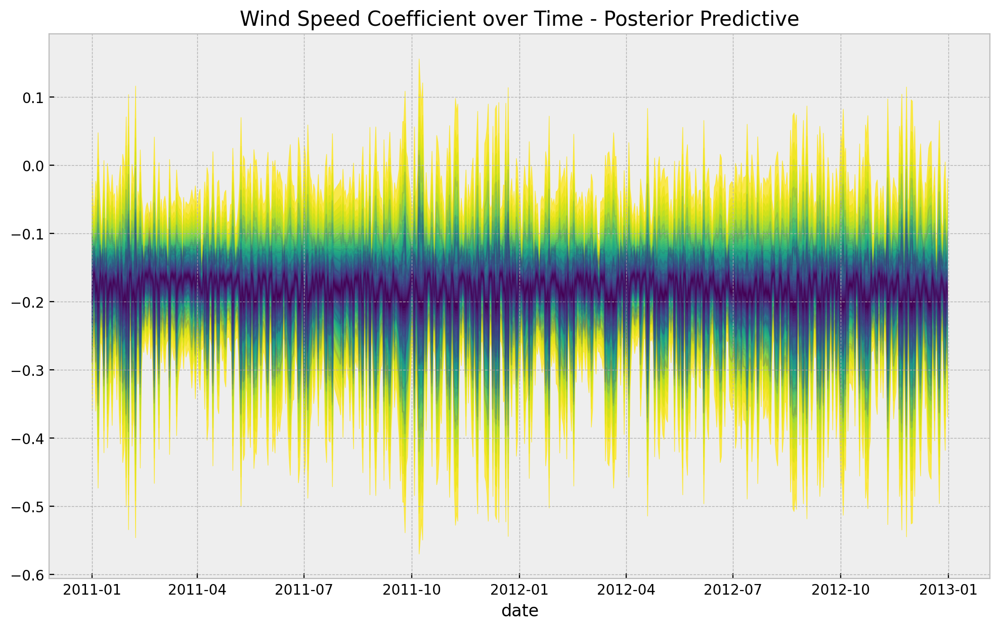

In [34]:
fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=b_windspeed_samples,
    x=date,
    palette="viridis_r",
)
ax.set(
    title="Wind Speed Coefficient over Time - Posterior Predictive",
    xlabel="date",
    ylabel=None,
)


**Remark:** Observe that the learned time-varying coefficients are very similar to the partial dependency plots of the tree-based ensemble model presented in the post [Exploring Tools for Interpretable Machine Learning](https://juanitorduz.github.io/interpretable_ml/).

## Effects Original Scale

We can transform back the time-varying effects to the original scale (see [How to vectorize an scikit-learn transformer over a `numpy` array?](https://juanitorduz.github.io/vectorize_sklearn_transformer/))

In [35]:
stacked_samples = np.moveaxis(
    a=np.stack(
        [
            b_temp_samples.to_numpy(),
            b_hum_samples.to_numpy(),
            b_windspeed_samples.to_numpy(),
        ],
        axis=1,
    ),
    source=1,
    destination=2,
)

vectorized_exog_scaler = np.vectorize(
    pyfunc=exog_scaler.transform,
    excluded=[1, 2],
    signature="(m, n) -> (m, n)",
)

stacked_samples_transformed = vectorized_exog_scaler(stacked_samples)
stacked_samples_transformed.shape


/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but MaxAbsScaler was fitted with feature names
  warnings.warn(
/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but MaxAbsScaler was fitted with feature names
  warnings.warn(
/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but MaxAbsScaler was fitted with feature names
  warnings.warn(
/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but MaxAbsScaler was fitted with feature names
  warnings.warn(
/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZ

(20000, 731, 3)

/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/arviz/plots/hdiplot.py:156: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)
/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/arviz/plots/hdiplot.py:156: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


[Text(0.5, 1.0, 'Temperature Coefficient (Original Scale) - Posterior Predictive'),
 Text(0.5, 0, 'temp'),
 Text(0, 0.5, '')]

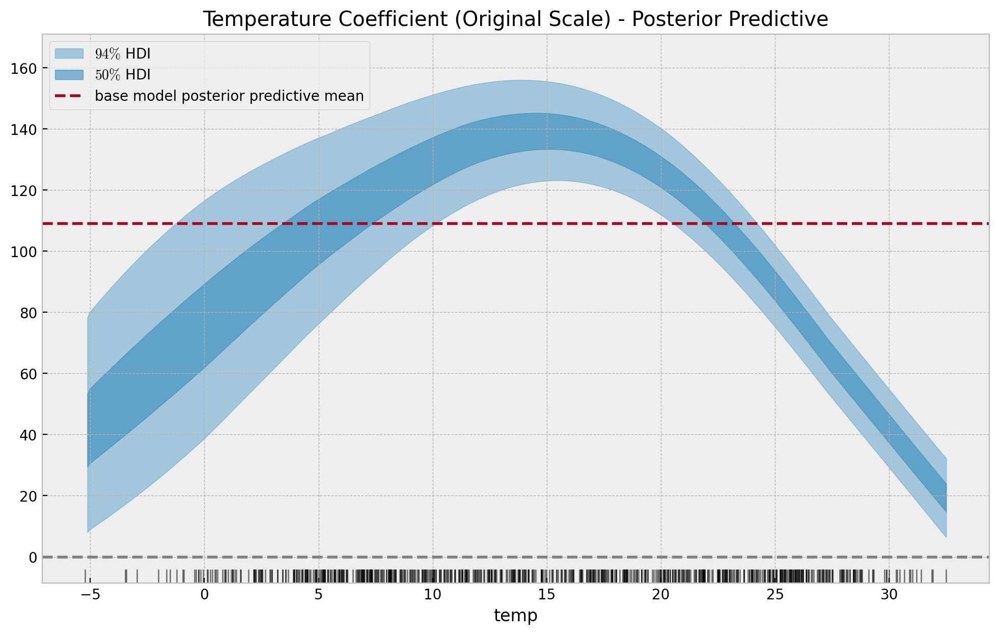

In [36]:
temp_samples_original_scale = endog_scaler.inverse_transform(
    stacked_samples_transformed[:, :, 0]
)


fig, ax = plt.subplots()
az.plot_hdi(
    x=data_df["temp"].to_numpy(),
    y=temp_samples_original_scale,
    hdi_prob=0.94,
    color="C0",
    fill_kwargs={"alpha": 0.4, "label": "$94\%$ HDI"},
    ax=ax,
)
az.plot_hdi(
    x=data_df["temp"].to_numpy(),
    y=temp_samples_original_scale,
    hdi_prob=0.5,
    color="C0",
    fill_kwargs={"alpha": 0.6, "label": "$50\%$ HDI"},
    ax=ax,
)
ax.axhline(
    y=109.06,  # <- from baseline model from previous post
    color="C1",
    linestyle="--",
    label="base model posterior predictive mean",
)
sns.rugplot(x=data_df["temp"], color="black", alpha=0.5, ax=ax)
ax.axhline(y=0.0, color="gray", linestyle="--")
ax.legend(loc="upper left")
ax.set(
    title="Temperature Coefficient (Original Scale) - Posterior Predictive",
    xlabel="temp",
    ylabel=None,
)

/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/arviz/plots/hdiplot.py:156: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)
/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/arviz/plots/hdiplot.py:156: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


[Text(0.5, 1.0, 'Humidity Coefficient (Original Scale) - Posterior Predictive'),
 Text(0.5, 0, 'hum'),
 Text(0, 0.5, '')]

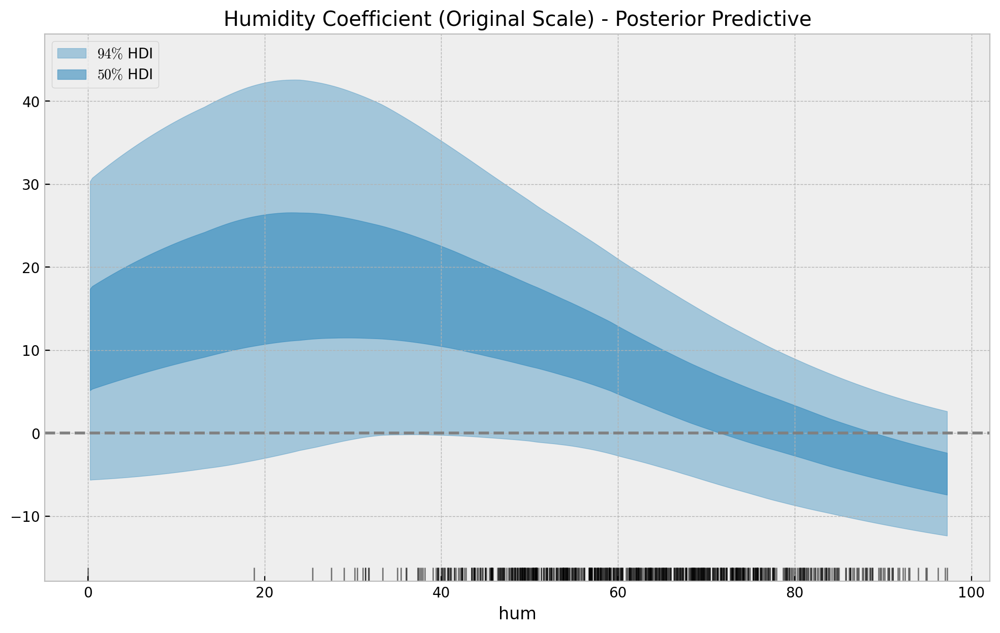

In [37]:
hum_samples_original_scale = endog_scaler.inverse_transform(
    stacked_samples_transformed[:, :, 1]
)


fig, ax = plt.subplots()
az.plot_hdi(
    x=data_df["hum"].to_numpy(),
    y=hum_samples_original_scale,
    hdi_prob=0.94,
    color="C0",
    fill_kwargs={"alpha": 0.4, "label": "$94\%$ HDI"},
    ax=ax,
)
az.plot_hdi(
    x=data_df["hum"].to_numpy(),
    y=hum_samples_original_scale,
    hdi_prob=0.5,
    color="C0",
    fill_kwargs={"alpha": 0.6, "label": "$50\%$ HDI"},
    ax=ax,
)
sns.rugplot(x=data_df["hum"], color="black", alpha=0.5, ax=ax)
ax.axhline(y=0.0, color="gray", linestyle="--")
ax.legend(loc="upper left")
ax.set(
    title="Humidity Coefficient (Original Scale) - Posterior Predictive",
    xlabel="hum",
    ylabel=None,
)

/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/arviz/plots/hdiplot.py:156: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)
/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/arviz/plots/hdiplot.py:156: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


[Text(0.5, 1.0, 'Wind Speed Coefficient (Original Scale) - Posterior Predictive'),
 Text(0.5, 0, 'windspeed'),
 Text(0, 0.5, '')]

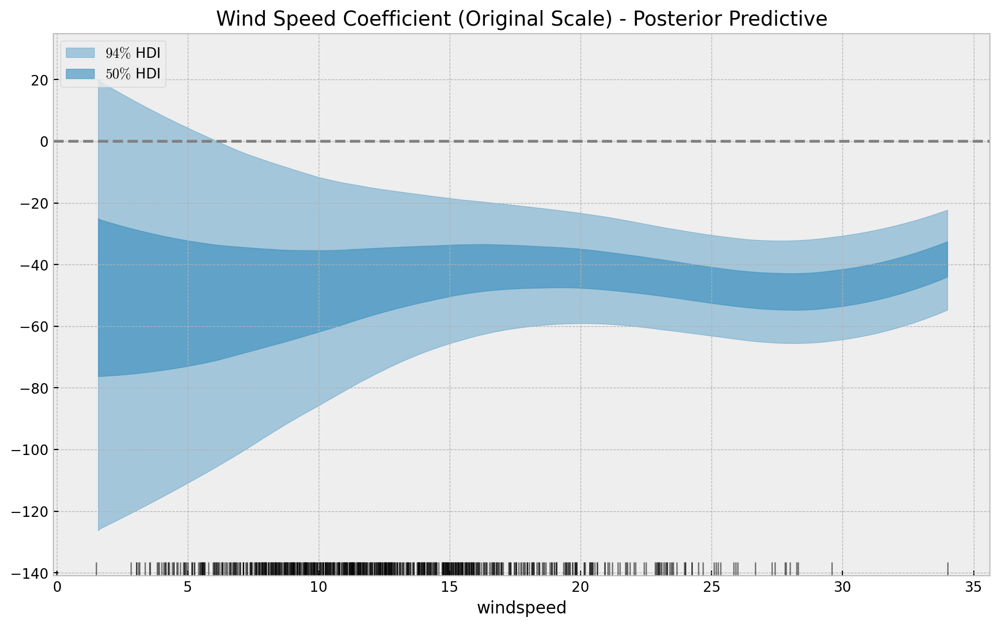

In [38]:
windspeed_samples_original_scale = endog_scaler.inverse_transform(
    stacked_samples_transformed[:, :, 2]
)


fig, ax = plt.subplots()
az.plot_hdi(
    x=data_df["windspeed"].to_numpy(),
    y=windspeed_samples_original_scale,
    hdi_prob=0.94,
    color="C0",
    fill_kwargs={"alpha": 0.4, "label": "$94\%$ HDI"},
    ax=ax,
)
az.plot_hdi(
    x=data_df["windspeed"].to_numpy(),
    y=windspeed_samples_original_scale,
    hdi_prob=0.5,
    color="C0",
    fill_kwargs={"alpha": 0.6, "label": "$50\%$ HDI"},
    ax=ax,
)
sns.rugplot(x=data_df["windspeed"], color="black", alpha=0.5, ax=ax)
ax.axhline(y=0.0, color="gray", linestyle="--")
ax.legend(loc="upper left")
ax.set(
    title="Wind Speed Coefficient (Original Scale) - Posterior Predictive",
    xlabel="windspeed",
    ylabel=None,
)